In [1]:
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
import astropy.units as u
import os
import sys
import h5py

from pymanticore.cosmology import ra_dec_to_galactic
from pymanticore.analysis.matplotlib import get_mplstyle_path, ManticoreColors

In [2]:
# Add parent directory to path
sys.path.insert(0, os.path.abspath('..'))

from stacking_backend import ClusterAnalysisPipeline, BasicPlotter, MapConfig
from stacking_backend.data import PatchExtractor

# Config 
config = MapConfig.for_planck_pr4(
    y_map_path="Chandran_compy//PR4_NILC_y_map.fits",
    masks_path="Chandran_compy//Masks.fits"
)

#config = MapConfig.for_planck_comcomp(
#    y_map_path="COM_CompMap/COM_CompMap_YSZ_R2.02/milca_ymaps.fits",
#    mask_path="COM_CompMap/COM_CompMap_YSZ_R2.02/COM_CompMap_Compton-SZMap-masks_2048_R2.01.fits"
#)

#config = MapConfig.for_planck_cmb_smica(
#    cmb_map_path="PlanckCMB/COM_CMB_IQU-smica_2048_R3.00_full.fits",
#)

# Initialize the analysis pipeline
pipeline = ClusterAnalysisPipeline(map_config=config)

# Create plotters
basic_plotter = BasicPlotter(pipeline.patch_extractor)
#summary_plotter = SummaryPlotter()
#mass_plotter = MassScalingPlotter()

mnras_style = "mnras"

🔍 LOADING MAP DATA
📍 Map file: PR4_NILC_y_map.fits
📍 Mask file: Masks.fits
📍 Format: healpix
📍 Coordinate system: Galactic
   Available columns: ('FULL', 'HALF-RING 1', 'HALF-RING 2')
   Using column: FULL
   NSIDE: 2048
   Ordering: RING
   Loading mask...
   Available mask columns: ('NILC-MASK', 'GAL-MASK', 'PS-MASK')
   Loading mask column: NILC-MASK
   Loading mask column: GAL-MASK
   Loading mask column: PS-MASK
   Combining 3 masks with AND
   Mask coverage: 56.6%
   Patch extractor initialized:
   - NSIDE: 2048
   - Nested: False
   - Coordinate system: Galactic
   - Mask available: True
✅ Pipeline initialized with healpix format map


/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


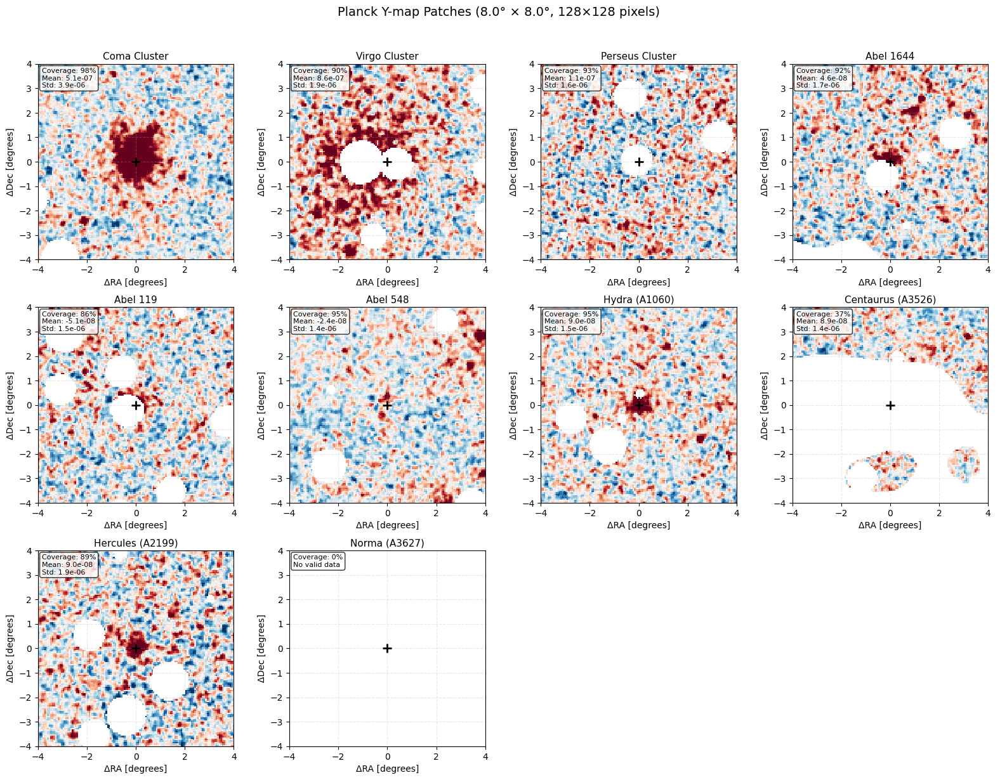


📊 Plotted 10 patches in 3×4 grid
  1. Coma Cluster: RA=194.95°, Dec=27.98°
  2. Virgo Cluster: RA=186.69°, Dec=12.83°
  3. Perseus Cluster: RA=23.40°, Dec=30.66°
  4. Abel 1644: RA=194.29°, Dec=-17.40°
  5. Abel 119: RA=14.08°, Dec=-1.22°
  6. Abel 548: RA=86.76°, Dec=-25.62°
  7. Hydra (A1060): RA=159.17°, Dec=-27.52°
  8. Centaurus (A3526): RA=192.20°, Dec=-41.31°
  9. Hercules (A2199): RA=247.16°, Dec=39.55°
  10. Norma (A3627): RA=243.59°, Dec=-60.87°


In [3]:
import numpy as np
import matplotlib.pyplot as plt

def plot_example_patches(examples, basic_plotter, patch_size_deg=8.0, npix=128):
    """Plot Compton y-map patches for a list of example coordinates in a grid"""
    
    n_examples = len(examples)
    
    # Determine subplot grid dimensions
    if n_examples <= 3:
        nrows, ncols = 1, n_examples
    elif n_examples <= 6:
        nrows, ncols = 2, 3
    elif n_examples <= 9:
        nrows, ncols = 3, 3
    elif n_examples <= 12:
        nrows, ncols = 3, 4
    else:
        ncols = 4
        nrows = (n_examples + ncols - 1) // ncols
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    
    # Flatten axes array for easier indexing
    if nrows * ncols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # Store all patches and determine global color scale
    all_patches = []
    all_vmin, all_vmax = float('inf'), float('-inf')
    
    # First pass: extract all patches and find global color limits
    for example in examples:
        # Convert RA/Dec to Galactic coordinates
        coord = SkyCoord(ra=example['ra']*u.deg, dec=example['dec']*u.deg, frame='icrs')
        gal_coord = coord.galactic
        gal_lon = gal_coord.l.deg
        gal_lat = gal_coord.b.deg
        
        # Extract patch
        patch_data, mask_patch = basic_plotter.patch_extractor.extract_patch(
            center_coords=(gal_lon, gal_lat),
            patch_size_deg=patch_size_deg,
            npix=npix
        )
        
        # Apply mask
        y_display = patch_data.copy()
        if mask_patch is not None:
            y_display[~mask_patch] = np.nan
        
        all_patches.append((y_display, mask_patch))
        
        # Update global color limits
        finite_data = y_display[np.isfinite(y_display)]
        if len(finite_data) > 0:
            vmin_patch, vmax_patch = np.percentile(finite_data, [5, 95])
            all_vmin = min(all_vmin, vmin_patch)
            all_vmax = max(all_vmax, vmax_patch)
    
    # Make color scale symmetric around zero
    vlim = max(abs(all_vmin), abs(all_vmax))
    vmin, vmax = -vlim, vlim
    
    # Second pass: plot all patches with consistent color scale
    for i, (example, (y_display, mask_patch)) in enumerate(zip(examples, all_patches)):
        ax = axes[i]
        
        # Plot extent
        extent = [-patch_size_deg/2, patch_size_deg/2, 
                  -patch_size_deg/2, patch_size_deg/2]
        
        # Plot y-map
        im = ax.imshow(y_display, extent=extent, origin='lower',
                      cmap='RdBu_r', vmin=vmin, vmax=vmax, interpolation='nearest')
        
        # Add center marker
        ax.plot(0, 0, 'k+', markersize=10, markeredgewidth=2)
        
        # Labels and formatting
        ax.set_xlabel('ΔRA [degrees]', fontsize=10)
        ax.set_ylabel('ΔDec [degrees]', fontsize=10)
        ax.set_title(example['title'], fontsize=11, pad=5)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_aspect('equal')
        
        # Add statistics text
        if mask_patch is not None:
            coverage = np.mean(mask_patch) * 100
        else:
            coverage = 100.0
        
        finite_data = y_display[np.isfinite(y_display)]
        if len(finite_data) > 0:
            mean_y = np.mean(finite_data)
            std_y = np.std(finite_data)
            stats_text = f'Coverage: {coverage:.0f}%\nMean: {mean_y:.1e}\nStd: {std_y:.1e}'
        else:
            stats_text = f'Coverage: {coverage:.0f}%\nNo valid data'
        
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
               verticalalignment='top', fontsize=8,
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Hide any empty subplots
    for i in range(n_examples, len(axes)):
        axes[i].axis('off')
    
    # Overall title
    fig.suptitle(f'Planck Y-map Patches ({patch_size_deg}° × {patch_size_deg}°, {npix}×{npix} pixels)', 
                fontsize=14, y=1.02)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"\n📊 Plotted {n_examples} patches in {nrows}×{ncols} grid")
    for i, example in enumerate(examples):
        print(f"  {i+1}. {example['title']}: RA={example['ra']:.2f}°, Dec={example['dec']:.2f}°")

# Example usage
examples = [
    {'ra': 194.95, 'dec': 27.98, 'title': 'Coma Cluster'},
    {'ra': 186.69, 'dec': 12.83, 'title': 'Virgo Cluster'},
    {'ra': 23.40, 'dec': 30.66, 'title': 'Perseus Cluster'},
    {'ra': 194.290417, 'dec': -17.400278, 'title': 'Abel 1644'},
    {'ra': 14.076250, 'dec': -1.216667, 'title': 'Abel 119'},
    {'ra': 86.757268, 'dec': -25.616331, 'title': 'Abel 548'},
    {'ra': 159.174167, 'dec': -27.524444, 'title': 'Hydra (A1060)'},
    {'ra': 192.199583, 'dec': -41.307778, 'title': 'Centaurus (A3526)'},
    {'ra': 247.158333, 'dec': 39.548611, 'title': 'Hercules (A2199)'},
    {'ra': 243.593750, 'dec': -60.868611, 'title': 'Norma (A3627)'}
]

# Call the function
plot_example_patches(examples, basic_plotter, patch_size_deg=8.0, npix=128)

### Load MCXC cluster catalog

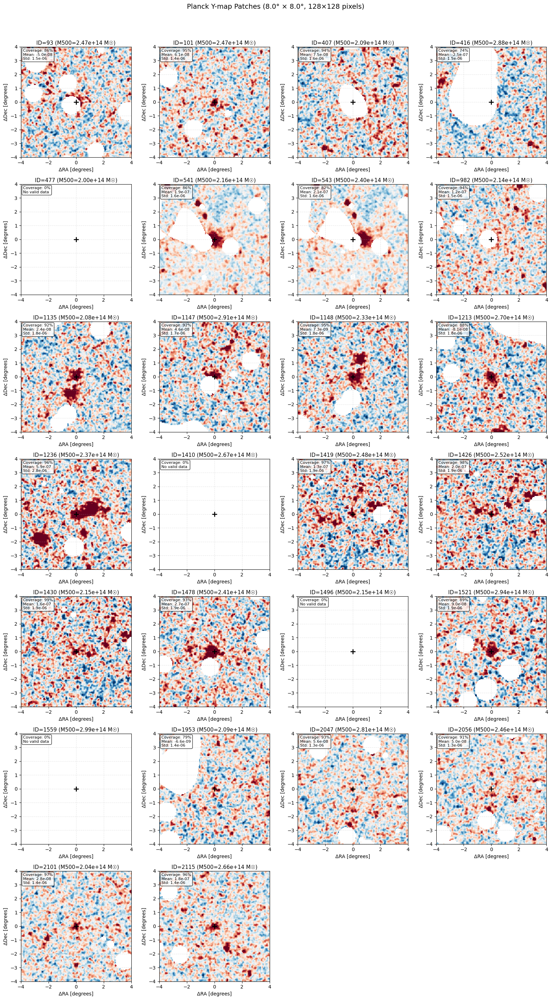


📊 Plotted 26 patches in 7×4 grid
  1. ID=93 (M500=2.47e+14 M☉): RA=14.08°, Dec=-1.22°
  2. ID=101 (M500=2.47e+14 M☉): RA=15.68°, Dec=-21.87°
  3. ID=407 (M500=2.09e+14 M☉): RA=66.46°, Dec=-8.56°
  4. ID=416 (M500=2.88e+14 M☉): RA=68.41°, Dec=-13.26°
  5. ID=477 (M500=2.00e+14 M☉): RA=80.70°, Dec=28.11°
  6. ID=541 (M500=2.16e+14 M☉): RA=96.59°, Dec=-53.70°
  7. ID=543 (M500=2.40e+14 M☉): RA=96.81°, Dec=-54.47°
  8. ID=982 (M500=2.14e+14 M☉): RA=176.15°, Dec=19.76°
  9. ID=1135 (M500=2.08e+14 M☉): RA=193.67°, Dec=-29.22°
  10. ID=1147 (M500=2.91e+14 M☉): RA=194.29°, Dec=-17.40°
  11. ID=1148 (M500=2.33e+14 M☉): RA=194.32°, Dec=-30.38°
  12. ID=1213 (M500=2.70e+14 M☉): RA=201.73°, Dec=-27.18°
  13. ID=1236 (M500=2.37e+14 M☉): RA=203.40°, Dec=-31.66°
  14. ID=1410 (M500=2.67e+14 M☉): RA=228.65°, Dec=-45.98°
  15. ID=1419 (M500=2.48e+14 M☉): RA=229.18°, Dec=7.02°
  16. ID=1426 (M500=2.52e+14 M☉): RA=230.46°, Dec=7.71°
  17. ID=1430 (M500=2.15e+14 M☉): RA=230.77°, Dec=8.60°
  18. ID=1478 (

In [4]:
# Load MCXC cluster catalog and plot 2 most massive
fname = "/cosma7/data/dp004/rttw52/Manticore/observational_data/mcxc_2_clusters/mcxc_clusters.hdf5"

with h5py.File(fname, "r") as f:
    _mcxc_data = f["all_clusters"][...]

_ra = np.degrees(_mcxc_data["phi"])
_dec = np.degrees(_mcxc_data["theta"])
gal_l, gal_b = ra_dec_to_galactic(_ra, _dec)
mcxc_data = {"gal_l": gal_l, "gal_b": gal_b, "z": _mcxc_data["z"], "m500": _mcxc_data["M500"]*1e14, "r500": _mcxc_data["R500"], "ids": np.array(range(len(gal_l))), "ids_to_exclude": []}

# Find 2 most massive clusters and plot them
#mass_indices = np.argsort(mcxc_data["m500"])[-2:][::-1]  # Get indices of 2 most massive, descending order
mass_indices = np.where((mcxc_data["m500"] >= 2e14) & (mcxc_data["m500"] <= 3e14) & (mcxc_data["z"] <= 0.06))[0]


mcxc_massive_examples = []
for i, idx in enumerate(mass_indices):
    mcxc_massive_examples.append({
        'ra': _ra[idx],
        'dec': _dec[idx], 
        'title': f'ID={mcxc_data["ids"][idx]} (M500={mcxc_data["m500"][idx]:.2e} M☉)'
    })

plot_example_patches(mcxc_massive_examples, basic_plotter)

In [5]:
# Exclude these
mcxc_data["ids_to_exclude"] = [6, 541, 543, 548, 1085, 1124, 1129, 1133, 1135, 1139, 1145, 1148, 1217, 1220, 1228, 1236, 1419, 1426, 1427, 1430, 1480, 1608]

### Load eROSITA cluster catalog

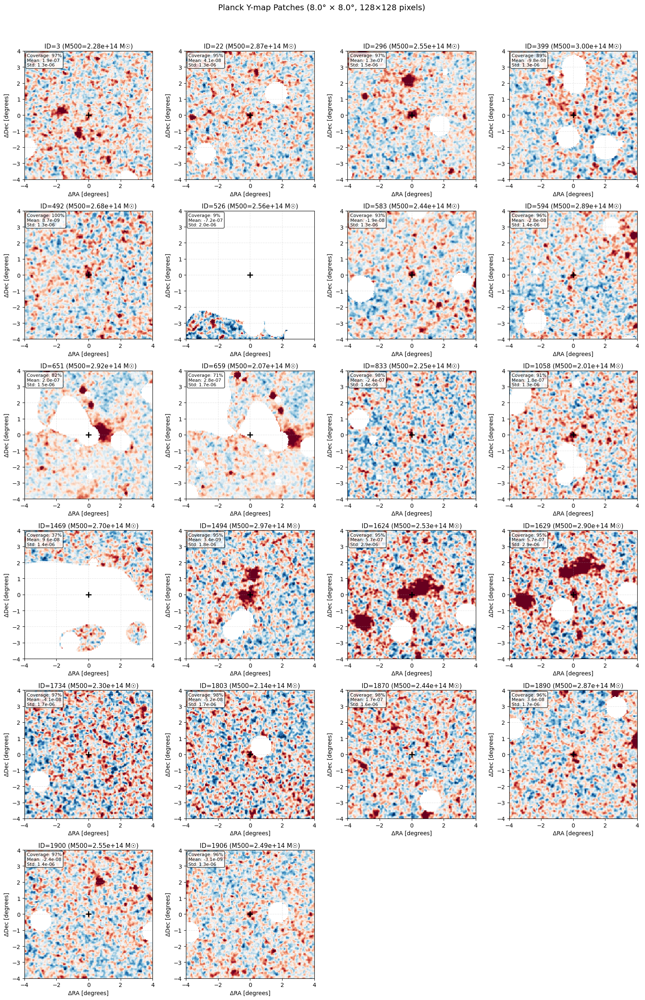


📊 Plotted 22 patches in 6×4 grid
  1. ID=3 (M500=2.28e+14 M☉): RA=0.81°, Dec=-35.93°
  2. ID=22 (M500=2.87e+14 M☉): RA=6.39°, Dec=-33.04°
  3. ID=296 (M500=2.55e+14 M☉): RA=52.47°, Dec=-52.58°
  4. ID=399 (M500=3.00e+14 M☉): RA=63.49°, Dec=-38.10°
  5. ID=492 (M500=2.68e+14 M☉): RA=75.20°, Dec=-38.68°
  6. ID=526 (M500=2.56e+14 M☉): RA=79.16°, Dec=6.45°
  7. ID=583 (M500=2.44e+14 M☉): RA=85.03°, Dec=-40.84°
  8. ID=594 (M500=2.89e+14 M☉): RA=87.16°, Dec=-25.48°
  9. ID=651 (M500=2.92e+14 M☉): RA=96.64°, Dec=-54.53°
  10. ID=659 (M500=2.07e+14 M☉): RA=97.85°, Dec=-56.17°
  11. ID=833 (M500=2.25e+14 M☉): RA=127.15°, Dec=30.42°
  12. ID=1058 (M500=2.01e+14 M☉): RA=153.42°, Dec=-0.93°
  13. ID=1469 (M500=2.70e+14 M☉): RA=192.21°, Dec=-41.31°
  14. ID=1494 (M500=2.97e+14 M☉): RA=193.90°, Dec=-30.34°
  15. ID=1624 (M500=2.53e+14 M☉): RA=202.88°, Dec=-31.82°
  16. ID=1629 (M500=2.90e+14 M☉): RA=203.12°, Dec=-33.13°
  17. ID=1734 (M500=2.30e+14 M☉): RA=211.87°, Dec=-27.02°
  18. ID=1803 (M500

In [6]:
# Load eROSITA cluster catalog and plot 2 most massive
fname = "/cosma7/data/dp004/rttw52/Manticore/observational_data/erosita_clusters/erosita_clusters.hdf5"

with h5py.File(fname, "r") as f:
    _eros_data = f["all_clusters_high_quality"][...]

_ra = np.degrees(_eros_data["phi"])
_dec = np.degrees(_eros_data["theta"])
gal_l, gal_b = ra_dec_to_galactic(_ra,_dec)
eros_data = {"gal_l": gal_l, "gal_b": gal_b, "z": _eros_data["z"], "m500": _eros_data["M500"]*1e14, "r500": _eros_data["R500"],  "ids": np.array(range(len(gal_l))), "ids_to_exclude": []}

# Find 2 most massive clusters and plot them
#mass_indices = np.argsort(eros_data["m500"])[-2:][::-1]  # Get indices of 2 most massive, descending order
mass_indices = np.where((eros_data["m500"] >= 2e14) & (eros_data["m500"] <= 3e14) & (eros_data["z"] <= 0.06))[0]

eros_massive_examples = []
for i, idx in enumerate(mass_indices):
    eros_massive_examples.append({
        'ra': _ra[idx],
        'dec': _dec[idx],
        'title': f'ID={eros_data["ids"][idx]} (M500={eros_data["m500"][idx]:.2e} M☉)'
    })

plot_example_patches(eros_massive_examples, basic_plotter)

In [7]:
# Exclude these
eros_data["ids_to_exclude"] = [9, 323, 590, 640, 651, 652, 659, 689, 1480, 1565, 1612, 1624, 1629]

## Load Manticore posterior clusters

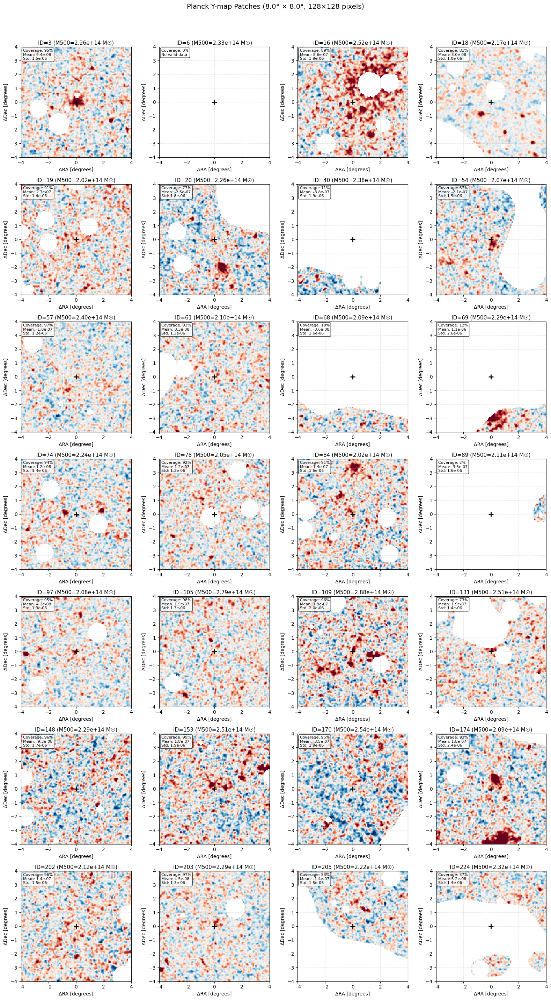


📊 Plotted 28 patches in 7×4 grid
  1. ID=3 (M500=2.26e+14 M☉): RA=159.15°, Dec=-27.58°
  2. ID=6 (M500=2.33e+14 M☉): RA=119.61°, Dec=-53.10°
  3. ID=16 (M500=2.52e+14 M☉): RA=188.65°, Dec=10.88°
  4. ID=18 (M500=2.17e+14 M☉): RA=94.07°, Dec=-65.01°
  5. ID=19 (M500=2.02e+14 M☉): RA=107.19°, Dec=49.44°
  6. ID=20 (M500=2.26e+14 M☉): RA=201.97°, Dec=-25.08°
  7. ID=40 (M500=2.38e+14 M☉): RA=78.78°, Dec=6.53°
  8. ID=54 (M500=2.07e+14 M☉): RA=71.72°, Dec=-15.89°
  9. ID=57 (M500=2.40e+14 M☉): RA=168.73°, Dec=29.31°
  10. ID=61 (M500=2.10e+14 M☉): RA=315.65°, Dec=-13.61°
  11. ID=68 (M500=2.09e+14 M☉): RA=44.48°, Dec=6.48°
  12. ID=69 (M500=2.29e+14 M☉): RA=45.51°, Dec=44.13°
  13. ID=74 (M500=2.24e+14 M☉): RA=316.57°, Dec=-39.53°
  14. ID=78 (M500=2.05e+14 M☉): RA=316.51°, Dec=-25.66°
  15. ID=84 (M500=2.02e+14 M☉): RA=27.34°, Dec=32.85°
  16. ID=89 (M500=2.11e+14 M☉): RA=43.74°, Dec=15.68°
  17. ID=97 (M500=2.08e+14 M☉): RA=6.43°, Dec=-33.09°
  18. ID=105 (M500=2.79e+14 M☉): RA=155.07°,

In [8]:
# Load Manticore posterior clusters and plot 2 most massive
import numpy as np
import h5py
from astropy.cosmology import Planck18, z_at_value
import astropy.units as u

fname = "/cosma7/data/dp004/rttw52/Manticore/new_analysis/clusters/posterior_associations/output/simplified_clusters.h5"

with h5py.File(fname, "r") as f:
    distances_mpc = f["clusters/median_properties/dist"][...]
    
    # Convert comoving distance to redshift using Planck18 cosmology
    redshifts = []
    for dist in distances_mpc:
        z = z_at_value(Planck18.comoving_distance, dist * u.Mpc)
        redshifts.append(z)
    
    manticore_data = {"gal_l": f["clusters/median_properties/gal_l"][...],
                      "gal_b": f["clusters/median_properties/gal_b"][...],
                      "m500": f["clusters/median_properties/SO_500_crit_TotalMass"][...],
                      "r500": f["clusters/median_properties/SO_500_crit_SORadius"][...],
                      "dist": distances_mpc,
                      "z": np.array(redshifts),
                      "ra": f["clusters/median_properties/ra"][...],
                      "dec": f["clusters/median_properties/dec"][...],
                      "ids": np.array(range(len(distances_mpc))),
                      "ids_to_exclude": []}

# Find 2 most massive clusters and plot them
mass_indices = np.where((manticore_data["m500"] >= 2e14) & (manticore_data["m500"] <= 3e14) & (manticore_data["z"] <= 0.06))[0]
#mass_indices = np.argsort(manticore_data["m500"])[-30:-20][::-1]  # Get indices of 2 most massive, descending order

manticore_massive_examples = []
for i, idx in enumerate(mass_indices):
    # Convert galactic to RA/Dec
    coord = SkyCoord(l=manticore_data["gal_l"][idx]*u.deg, b=manticore_data["gal_b"][idx]*u.deg, frame='galactic')
    icrs_coord = coord.icrs
    
    manticore_massive_examples.append({
        'ra': manticore_data["ra"][idx],
        'dec': manticore_data["dec"][idx],
        'title': f'ID={manticore_data["ids"][idx]} (M500={manticore_data["m500"][idx]:.2e} M☉)'
    })

plot_example_patches(manticore_massive_examples, basic_plotter)

In [9]:
# Exclude these
manticore_data["ids_to_exclude"] = [16,109,153]

In [10]:
def plot_halo_overview(halo_data, z_min=None, z_max=None, figsize=(15, 10), cat_name=""):
    """
    Plot overview of cluster data.
    
    Parameters
    ----------
    halo_data : dict
        Dictionary containing cluster data with keys: 'gal_l', 'gal_b', 'z', 'm500', 'r500'
    z_min : float, optional
        Minimum redshift to include in plots
    z_max : float, optional
        Maximum redshift to include in plots
    figsize : tuple, optional
        Figure size (width, height)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Apply redshift filter if specified
    if z_min is not None or z_max is not None:
        z_mask = np.ones(len(halo_data["z"]), dtype=bool)
        if z_min is not None:
            z_mask &= (halo_data["z"] >= z_min)
        if z_max is not None:
            z_mask &= (halo_data["z"] <= z_max)

        # Create filtered data
        filtered_data = {key: np.array(values)[z_mask] for key, values in halo_data.items() if key != "ids_to_exclude"}
        title_suffix = f" (z: {z_min or 'min'} - {z_max or 'max'})"
    else:
        filtered_data = halo_data
        title_suffix = ""
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle(f'{cat_name} Clusters Overview{title_suffix}', fontsize=16, fontweight='bold')

    # 1. Sky distribution in galactic coordinates
    ax1 = axes[0, 0]
    scatter = ax1.scatter(filtered_data["gal_l"], filtered_data["gal_b"], 
                         c=filtered_data["z"], cmap='viridis', alpha=0.7, s=20)
    ax1.set_xlabel('Galactic Longitude (deg)')
    ax1.set_ylabel('Galactic Latitude (deg)')
    ax1.set_title('Sky Distribution (colored by redshift)')
    ax1.set_xlim(0, 360)
    ax1.set_ylim(-90, 90)
    plt.colorbar(scatter, ax=ax1, label='Redshift')

    # 2. Redshift distribution
    ax2 = axes[0, 1]
    ax2.hist(filtered_data["z"], bins=30, alpha=0.7, edgecolor='black')
    ax2.set_xlabel('Redshift')
    ax2.set_ylabel('Number of Clusters')
    ax2.set_title('Redshift Distribution')
    
    # Mean and median lines
    ax2.axvline(np.mean(filtered_data["z"]), color='orange', linestyle='-', 
               label=f'Mean: {np.mean(filtered_data["z"]):.3f}')
    ax2.axvline(np.median(filtered_data["z"]), color='red', linestyle='--', 
               label=f'Median: {np.median(filtered_data["z"]):.3f}')
    
    # Add mean and median redshift lines for z <= 0.06
    low_z_mask = np.array(filtered_data["z"]) <= 0.06
    if np.any(low_z_mask):
        low_z_mean = np.mean(np.array(filtered_data["z"])[low_z_mask])
        low_z_median = np.median(np.array(filtered_data["z"])[low_z_mask])
        ax2.axvline(low_z_mean, color='green', linestyle='-', 
                   label=f'Mean (z≤0.06): {low_z_mean:.3f}')
        ax2.axvline(low_z_median, color='blue', linestyle=':', 
                   label=f'Median (z≤0.06): {low_z_median:.3f}')
    
    ax2.legend()

    # 3. Mass distribution
    ax3 = axes[0, 2]
    ax3.hist(np.log10(filtered_data["m500"]), bins=30, alpha=0.7, edgecolor='black')
    ax3.set_xlabel('log₁₀(M₅₀₀) [M☉]')
    ax3.set_ylabel('Number of Clusters')
    ax3.set_title('Mass Distribution')
    ax3.axvline(np.log10(np.median(filtered_data["m500"])), color='red', linestyle='--',
               label=f'Median: {np.median(filtered_data["m500"]):.1e} M☉')
    ax3.legend()

    # 4. R500 distribution
    ax4 = axes[1, 0]
    ax4.hist(filtered_data["r500"], bins=30, alpha=0.7, edgecolor='black')
    ax4.set_xlabel('R₅₀₀ [Mpc]')
    ax4.set_ylabel('Number of Clusters')
    ax4.set_title('R₅₀₀ Distribution')
    ax4.axvline(np.median(filtered_data["r500"]), color='red', linestyle='--',
               label=f'Median: {np.median(filtered_data["r500"]):.2f} Mpc')
    ax4.legend()

    # 5. Mass vs Redshift
    ax5 = axes[1, 1]
    scatter2 = ax5.scatter(filtered_data["z"], np.log10(filtered_data["m500"]), 
                          c=filtered_data["r500"], cmap='plasma', alpha=0.7, s=20)
    ax5.set_xlabel('Redshift')
    ax5.set_ylabel('log₁₀(M₅₀₀) [M☉]')
    ax5.set_title('Mass vs Redshift (colored by R₅₀₀)')
    plt.colorbar(scatter2, ax=ax5, label='R₅₀₀ [Mpc]')

    # 6. Data summary statistics
    ax6 = axes[1, 2]
    ax6.axis('off')
    
    n_total = len(halo_data["z"])
    n_filtered = len(filtered_data["z"])
    
    stats_text = f"""Data Summary:
Total Clusters: {n_total:,}
Filtered Clusters: {n_filtered:,}
Filter: z ∈ [{z_min or 'min'}, {z_max or 'max'}]

Redshift:
  Range: {np.min(filtered_data["z"]):.3f} - {np.max(filtered_data["z"]):.3f}
  Mean: {np.mean(filtered_data["z"]):.3f}
  Std: {np.std(filtered_data["z"]):.3f}

Mass (M₅₀₀):
  Range: {np.min(filtered_data["m500"]):.1e} - {np.max(filtered_data["m500"]):.1e} M☉
  Mean: {np.mean(filtered_data["m500"]):.1e} M☉
  
R₅₀₀:
  Range: {np.min(filtered_data["r500"]):.2f} - {np.max(filtered_data["r500"]):.2f} Mpc
  Mean: {np.mean(filtered_data["r500"]):.2f} Mpc

Sky Coverage:
  Gal_l: {np.min(filtered_data["gal_l"]):.1f}° - {np.max(filtered_data["gal_l"]):.1f}°
  Gal_b: {np.min(filtered_data["gal_b"]):.1f}° - {np.max(filtered_data["gal_b"]):.1f}°"""

    ax6.text(0.05, 0.95, stats_text, transform=ax6.transAxes, fontsize=10,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

    plt.tight_layout()
    plt.show()

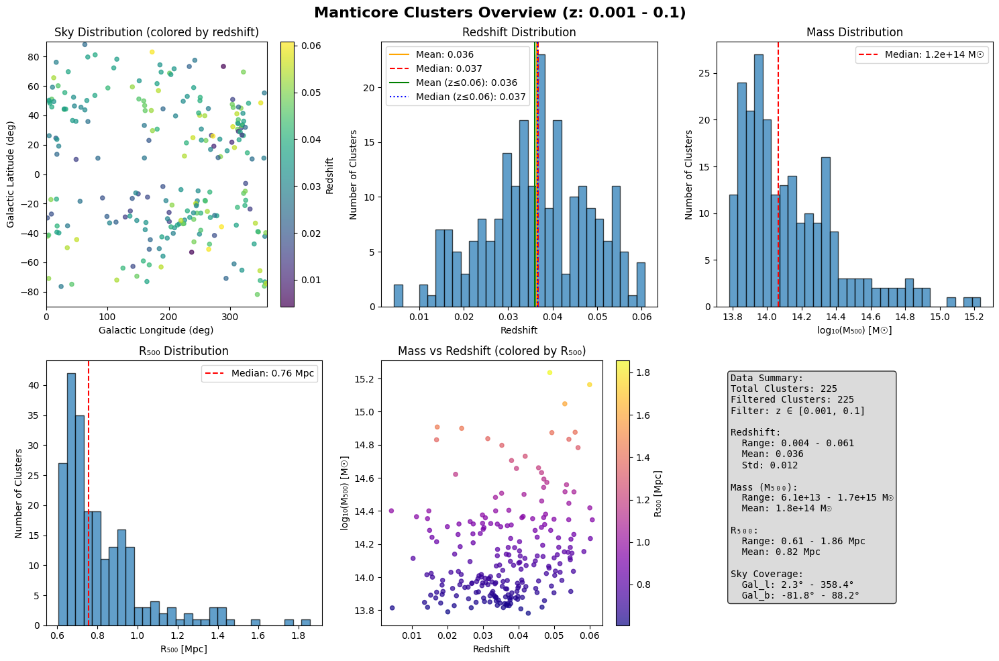

In [11]:
# plot_mcxc_overview(mcxc_data)  # Plot all data
plot_halo_overview(manticore_data, z_min=0.001, z_max=0.1, cat_name="Manticore")

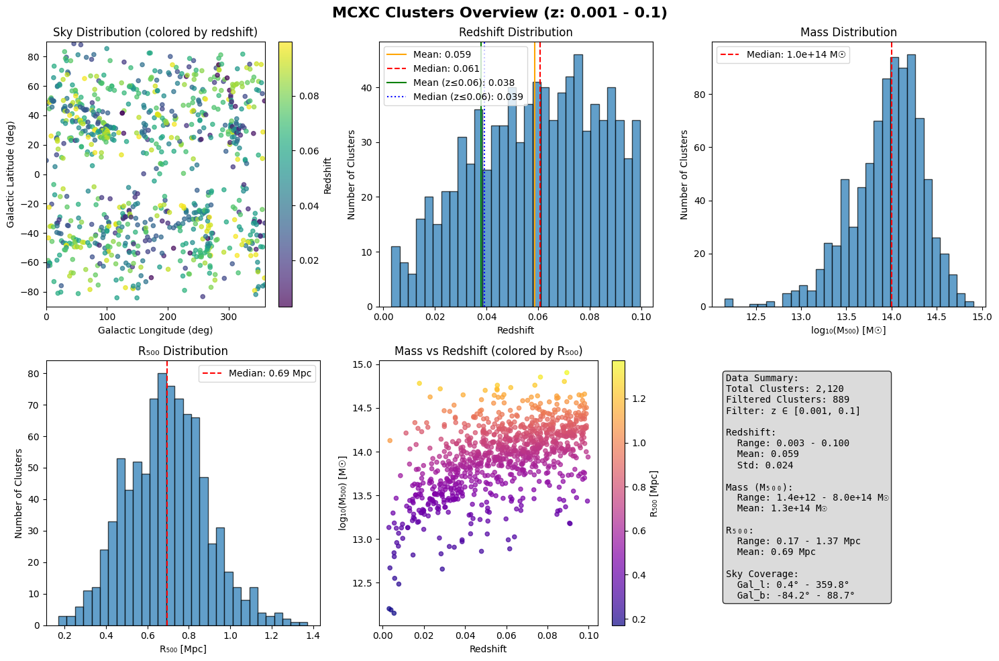

In [12]:
plot_halo_overview(mcxc_data, z_min=0.001, z_max=0.1, cat_name="MCXC")

/tmp/ipykernel_914360/4183592311.py:76: RuntimeWarning: invalid value encountered in log10
  ax3.hist(np.log10(filtered_data["m500"]), bins=30, alpha=0.7, edgecolor='black')
/tmp/ipykernel_914360/4183592311.py:96: RuntimeWarning: invalid value encountered in log10
  scatter2 = ax5.scatter(filtered_data["z"], np.log10(filtered_data["m500"]),


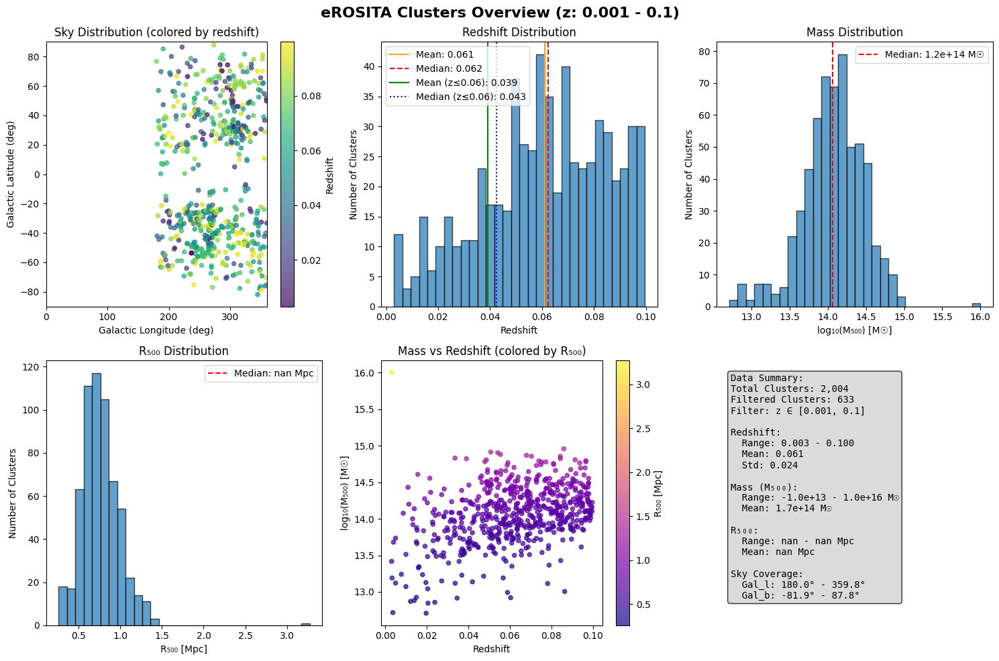

In [13]:
plot_halo_overview(eros_data, z_min=0.001, z_max=0.1, cat_name="eROSITA")

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, BoundaryNorm, ListedColormap
from stacking_backend.utils import mpc_to_angular_degrees

# ─── CONFIGURATION ────────────────────────────────────────────────────
mass_bins = [
    (1e14, 2e14),
    (2e14, 3e14),
    (3e14, 4e14),
]
selected_mass_bin_index = 1

# Create null dataset with random pointings but real manticore masses/r500s
np.random.seed(43)  # for reproducibility

# Use actual manticore masses, r500s, and redshifts
null_m500 = np.array(manticore_data['m500'])
null_r500 = np.array(manticore_data['r500'])
null_z = np.array(manticore_data['z'])
n_null = len(null_m500)

# Generate random gal_l (0-360 degrees)
null_gal_l = np.random.uniform(0, 360, n_null)

# Generate random gal_b within constraint
null_gal_b = np.concatenate([
    np.random.uniform(-89, -10, n_null//2),
    np.random.uniform(10, 89, n_null - n_null//2)
])

null_data = {
    'gal_l': null_gal_l,
    'gal_b': null_gal_b,
    'z': null_z,
    'm500': null_m500,
    'r500': null_r500,
    "ids": np.array(range(len(null_z))),
    "ids_to_exclude": []
}

datasets = {
    'manticore': manticore_data,
    'erosita':  eros_data,
    'mcxc':     mcxc_data,
    'null':     null_data
}

# Analysis parameters
inner_r500_factor = 2.0
outer_r500_factor = 6.0
patch_size_r500   = 20.0  # Patch spans ±10 R500 (from -10 to +10)
npix              = 512
z_min, z_max      = 0.005, 0.06
b_min, b_max      = 10, 90
min_coverage      = 0.8
n_bootstrap       = 500
run_null_tests    = False
n_random          = 500

# ─── RUN ANALYSIS ─────────────────────────────────────────────────────
results_dict = {}

for ds_name, ds_data in datasets.items():
    results_dict[ds_name] = {}
    
    for m1, m2 in mass_bins:
        label = f"{m1:.1e}-{m2:.1e}"
        coords = []
        
        for l, b, z, m500, r500, cluster_id in zip(
                ds_data['gal_l'], ds_data['gal_b'],
                ds_data['z'], ds_data['m500'], ds_data['r500'], ds_data["ids"]
            ):
            if (
                z_min < z < z_max and
                b_min < abs(b) < b_max and
                m1 <= m500 <= m2 and
                cluster_id not in ds_data["ids_to_exclude"]
            ):
                coords.append([l, b,
                               mpc_to_angular_degrees(r500, z),
                               z])
        
        coords = np.array(coords)
        
        if len(coords) < 5:
            continue
        
        res = pipeline.run_individual_r500_analysis_with_validation(
            coord_list=coords,
            inner_r500_factor=inner_r500_factor,
            outer_r500_factor=outer_r500_factor,
            patch_size_r500=patch_size_r500,  # Changed from patch_size_deg
            npix=npix,
            min_coverage=min_coverage,
            run_null_tests=run_null_tests,
            n_bootstrap=n_bootstrap,
            n_random=n_random
        )
        
        results_dict[ds_name][label] = res

🚀 CLUSTER ANALYSIS PIPELINE
⚙️  Analysis mode: TSZ
⚙️  Scaling mode: R/R500
⚙️  Patch size: ±10.0 × R500

🔍 Step 1: Individual cluster processing...
🔍 Calculating individual cluster measurements (full mode)...


/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 47 valid measurements
   📊 Mean S/N: 17.01
   📊 High S/N fraction (>3σ): 72.3%
   ❌ Rejected: 26 clusters
      - insufficient_coverage: 19
      - insufficient_mask_coverage: 7

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 47 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 42 valid patches
   Rejected: 5 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 34-42 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 3.25e-07
   Corrected signal: 3.25e-07

📊 Error Budget:
   Sample std: 6.85e-08 (99.9%)
   Measurement std: 2.55e-09 (0.1%)
   Total error: 6.85e-08

📊 Detection Significance:
   Primary (corrected): 4.75σ
   Simple (uncorrected): 4.75σ
   Conservative: 4.75σ

📊 Confidence Intervals:
   68% CI:

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 12 valid measurements
   📊 Mean S/N: 20.39
   📊 High S/N fraction (>3σ): 75.0%
   ❌ Rejected: 13 clusters
      - insufficient_coverage: 12
      - insufficient_mask_coverage: 1

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 12 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 11 valid patches
   Rejected: 1 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 7-11 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 4.53e-07
   Corrected signal: 4.53e-07

📊 Error Budget:
   Sample std: 1.50e-07 (99.9%)
   Measurement std: 5.55e-09 (0.1%)
   Total error: 1.50e-07

📊 Detection Significance:
   Primary (corrected): 3.03σ
   Simple (uncorrected): 3.03σ
   Conservative: 3.03σ

📊 Confidence Intervals:
   68% CI: 

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 7 valid measurements
   📊 Mean S/N: 53.03
   📊 High S/N fraction (>3σ): 100.0%
   ❌ Rejected: 2 clusters
      - insufficient_coverage: 1
      - insufficient_mask_coverage: 1

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 7 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 7 valid patches
   Rejected: 0 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 5-7 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 1.62e-06
   Corrected signal: 1.62e-06

📊 Error Budget:
   Sample std: 6.61e-07 (100.0%)
   Measurement std: 1.26e-08 (0.0%)
   Total error: 6.61e-07

📊 Detection Significance:
   Primary (corrected): 2.46σ
   Simple (uncorrected): 2.46σ
   Conservative: 2.46σ

📊 Confidence Intervals:
   68% CI: [9.6

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 36 valid measurements
   📊 Mean S/N: 25.65
   📊 High S/N fraction (>3σ): 77.8%
   ❌ Rejected: 22 clusters
      - insufficient_coverage: 13
      - insufficient_mask_coverage: 9

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 36 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 34 valid patches
   Rejected: 2 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 27-34 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 4.73e-07
   Corrected signal: 4.73e-07

📊 Error Budget:
   Sample std: 9.83e-08 (99.9%)
   Measurement std: 2.87e-09 (0.1%)
   Total error: 9.84e-08

📊 Detection Significance:
   Primary (corrected): 4.80σ
   Simple (uncorrected): 4.80σ
   Conservative: 4.80σ

📊 Confidence Intervals:
   68% CI:

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 15 valid measurements
   📊 Mean S/N: 44.55
   📊 High S/N fraction (>3σ): 86.7%
   ❌ Rejected: 3 clusters
      - insufficient_coverage: 2
      - insufficient_mask_coverage: 1

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 15 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 15 valid patches
   Rejected: 0 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 11-15 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 1.12e-06
   Corrected signal: 1.12e-06

📊 Error Budget:
   Sample std: 3.00e-07 (100.0%)
   Measurement std: 5.87e-09 (0.0%)
   Total error: 3.00e-07

📊 Detection Significance:
   Primary (corrected): 3.74σ
   Simple (uncorrected): 3.74σ
   Conservative: 3.74σ

📊 Confidence Intervals:
   68% CI: 

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 3 valid measurements
   📊 Mean S/N: 75.33
   📊 High S/N fraction (>3σ): 100.0%
   ❌ Rejected: 5 clusters
      - insufficient_coverage: 2
      - insufficient_mask_coverage: 3

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 3 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 2 valid patches
   Rejected: 1 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 1-2 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 2.89e-06
   Corrected signal: 2.89e-06

📊 Error Budget:
   Sample std: 5.62e-07 (99.8%)
   Measurement std: 2.19e-08 (0.2%)
   Total error: 5.62e-07

📊 Detection Significance:
   Primary (corrected): 5.14σ
   Simple (uncorrected): 5.14σ
   Conservative: 5.14σ

📊 Confidence Intervals:
   68% CI: [2.32

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 48 valid measurements
   📊 Mean S/N: 54.94
   📊 High S/N fraction (>3σ): 89.6%
   ❌ Rejected: 23 clusters
      - insufficient_coverage: 19
      - insufficient_mask_coverage: 4

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 48 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 41 valid patches
   Rejected: 7 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 33-41 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 1.22e-06
   Corrected signal: 1.22e-06

📊 Error Budget:
   Sample std: 1.15e-07 (99.9%)
   Measurement std: 3.10e-09 (0.1%)
   Total error: 1.15e-07

📊 Detection Significance:
   Primary (corrected): 10.57σ
   Simple (uncorrected): 10.57σ
   Conservative: 10.57σ

📊 Confidence Intervals:
   68% 

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 8 valid measurements
   📊 Mean S/N: 64.28
   📊 High S/N fraction (>3σ): 100.0%
   ❌ Rejected: 7 clusters
      - insufficient_coverage: 2
      - insufficient_mask_coverage: 5

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 8 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 7 valid patches
   Rejected: 1 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 3-7 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 2.09e-06
   Corrected signal: 2.09e-06

📊 Error Budget:
   Sample std: 4.65e-07 (99.9%)
   Measurement std: 1.12e-08 (0.1%)
   Total error: 4.65e-07

📊 Detection Significance:
   Primary (corrected): 4.49σ
   Simple (uncorrected): 4.49σ
   Conservative: 4.49σ

📊 Confidence Intervals:
   68% CI: [1.61

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 49 valid measurements
   📊 Mean S/N: -1.69
   📊 High S/N fraction (>3σ): 40.8%
   ❌ Rejected: 24 clusters
      - insufficient_coverage: 20
      - insufficient_mask_coverage: 4

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 49 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 43 valid patches
   Rejected: 6 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 34-43 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: -1.20e-08
   Corrected signal: -1.20e-08

📊 Error Budget:
   Sample std: 4.47e-08 (99.8%)
   Measurement std: 2.22e-09 (0.2%)
   Total error: 4.48e-08

📊 Detection Significance:
   Primary (corrected): -0.27σ
   Simple (uncorrected): -0.27σ
   Conservative: -0.27σ

📊 Confidence Intervals:
   68

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 17 valid measurements
   📊 Mean S/N: -9.72
   📊 High S/N fraction (>3σ): 23.5%
   ❌ Rejected: 10 clusters
      - insufficient_coverage: 8
      - insufficient_mask_coverage: 2

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 17 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 17 valid patches
   Rejected: 0 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 11-17 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: -1.44e-07
   Corrected signal: -1.44e-07

📊 Error Budget:
   Sample std: 5.64e-08 (99.6%)
   Measurement std: 3.69e-09 (0.4%)
   Total error: 5.65e-08

📊 Detection Significance:
   Primary (corrected): -2.55σ
   Simple (uncorrected): -2.55σ
   Conservative: -2.55σ

📊 Confidence Intervals:
   68%

/snap7/scratch/dp004/rttw52/manticore_venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


   ✅ Calculated 4 valid measurements
   📊 Mean S/N: 1.20
   📊 High S/N fraction (>3σ): 25.0%
   ❌ Rejected: 5 clusters
      - insufficient_coverage: 4
      - insufficient_mask_coverage: 1

🔄 Step 2: Robust bootstrap error estimation (500 samples)...

📈 Step 4: Computing corrected detection significance...

📚 Step 5: Stacking patches in R/R500 mode...
🔄 Stacking 4 patches in R/R500 mode...
   Patch size: ±10.0 × R500
✅ Using 4 valid patches
   Rejected: 0 (coverage), 0 (errors), 0 (rescaling failed)
   Stack dimensions: (512, 512)
   Coordinate system: r500_units (±10.0 × R500)
   Valid pixel range: 2-4 patches

🎯 ANALYSIS RESULTS:
📊 Signal Detection (estimator: delta_y):
   Raw signal: 1.91e-08
   Corrected signal: 1.91e-08

📊 Error Budget:
   Sample std: 1.95e-07 (99.8%)
   Measurement std: 8.30e-09 (0.2%)
   Total error: 1.95e-07

📊 Detection Significance:
   Primary (corrected): 0.10σ
   Simple (uncorrected): 0.10σ
   Conservative: 0.10σ

📊 Confidence Intervals:
   68% CI: [-1.95e

📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 10.0 × R500
📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 10.0 × R500
📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 10.0 × R500
📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 10.0 × R500
📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 10.0 × R500
📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 10.0 × R500
   Profile calculated: 20/20 valid bins
  

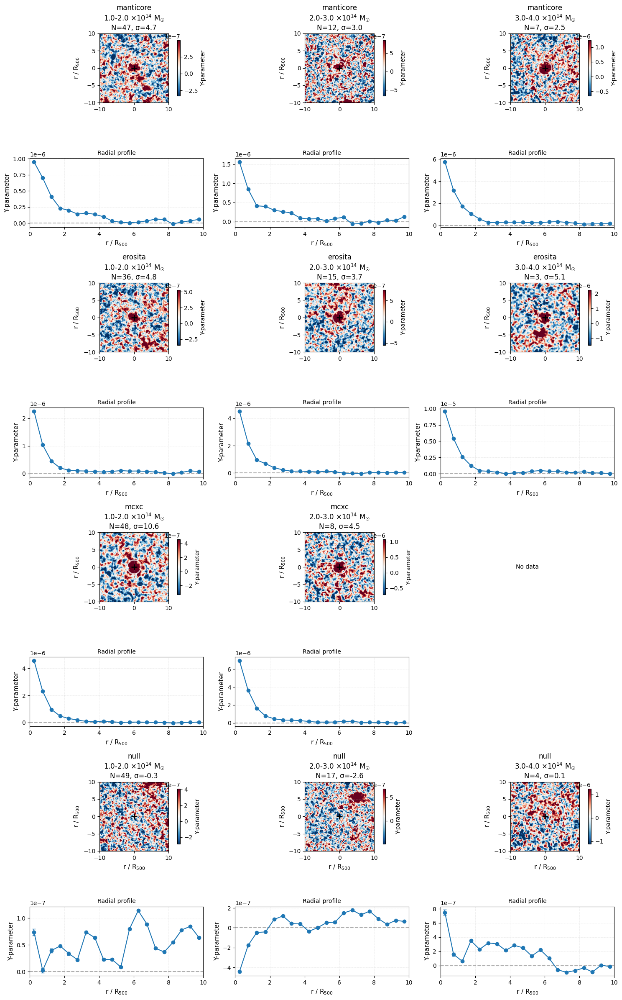

In [22]:
# ─── PLOT STACKED PATCHES + RADIAL PROFILES ───────────────────────────

max_radius_r500 = 10.0          # for radial profiles
n_radial_bins = 20

# Use only datasets that are actually present, but keep your preferred order
dataset_order = ['manticore', 'erosita', 'mcxc', 'null']
available_datasets = [ds for ds in dataset_order if ds in results_dict]

n_datasets = len(available_datasets)
n_mass_bins = len(mass_bins)

# We now make 2 rows per dataset: top = stacked patch, bottom = radial profile
n_rows = 2 * n_datasets

fig, axes = plt.subplots(n_rows, n_mass_bins,
                         figsize=(5 * n_mass_bins, 6 * n_datasets))

# Ensure axes is 2D
if n_mass_bins == 1:
    axes = axes.reshape(n_rows, 1)

for ds_idx, ds_name in enumerate(available_datasets):
    row_img = 2 * ds_idx       # row for the image
    row_prof = 2 * ds_idx + 1  # row for the radial profile
    
    for j, (m1, m2) in enumerate(mass_bins):
        label = f"{m1:.1e}-{m2:.1e}"
        
        ax_img = axes[row_img, j]
        ax_prof = axes[row_prof, j]
        
        # Check if we have results for this combination
        if label not in results_dict[ds_name]:
            # Turn off both axes and mark as 'No data' in the top panel
            ax_img.axis('off')
            ax_prof.axis('off')
            ax_img.text(0.5, 0.5, 'No data', ha='center', va='center', 
                        transform=ax_img.transAxes)
            continue
        
        res = results_dict[ds_name][label]
        
        # ── STACKED PATCH PLOT (TOP) ───────────────────────────────────
        stacked_patch = res['stacked_patch']
        stacking_info = res['stacking_info']
        patch_size_r500 = res['patch_size_r500']
        
        # Color limits (5th–95th percentile)
        finite_data = stacked_patch[np.isfinite(stacked_patch)]
        if len(finite_data) > 0:
            vmin, vmax = np.percentile(finite_data, [5, 95])
        else:
            vmin, vmax = -1e-6, 1e-6
        
        # Extent in r/R500 units
        extent = [-patch_size_r500/2, patch_size_r500/2, 
                  -patch_size_r500/2, patch_size_r500/2]
        
        im = ax_img.imshow(stacked_patch, extent=extent, origin='lower',
                           cmap='RdBu_r', vmin=vmin, vmax=vmax, 
                           interpolation='nearest')
        
        # Center marker
        ax_img.plot(0, 0, 'k+', markersize=10, markeredgewidth=2)
        
        # Aperture circles (in r/R500 units)
        inner_circle = plt.Circle((0, 0), inner_r500_factor, 
                                  fill=False, color='white', 
                                  linewidth=2, linestyle='-', alpha=0.7)
        outer_circle = plt.Circle((0, 0), outer_r500_factor, 
                                  fill=False, color='white', 
                                  linewidth=2, linestyle='--', alpha=0.7)
        ax_img.add_patch(inner_circle)
        ax_img.add_patch(outer_circle)
        
        # Labels and formatting
        ax_img.set_ylabel('r / R$_{500}$', fontsize=11)
        if ds_idx == n_datasets - 1:
            # Only bottom dataset gets x-labels on the image row
            ax_img.set_xlabel('r / R$_{500}$', fontsize=11)
        
        # Title with stats
        n_clusters = res['n_measurements']
        if res['analysis_mode'] == 'tsz':
            significance = res['significance']
            title = (
                f"{ds_name}\n"
                f"{m1/1e14:.1f}-{m2/1e14:.1f} ×10$^{{14}}$ M$_☉$\n"
                f"N={n_clusters}, σ={significance:.1f}"
            )
        else:
            title = (
                f"{ds_name}\n"
                f"{m1/1e14:.1f}-{m2/1e14:.1f} ×10$^{{14}}$ M$_☉$\n"
                f"N={n_clusters}"
            )
        
        ax_img.set_title(title, fontsize=12)
        ax_img.set_aspect('equal')
        
        # Colorbar
        cbar = plt.colorbar(im, ax=ax_img, shrink=0.8)
        cbar.set_label('Y-parameter', fontsize=10)
        
        # Grid
        ax_img.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
        
        # ── RADIAL PROFILE PLOT (BOTTOM) ───────────────────────────────
        radii, profile, errors, counts = RadialProfileCalculator.calculate_profile_from_results(
            results=res,
            n_radial_bins=n_radial_bins,
            max_radius_r500=max_radius_r500
        )
        
        ax_prof.errorbar(radii, profile, yerr=errors, fmt='o-', capsize=3)
        ax_prof.axhline(0, color='k', linestyle='--', alpha=0.3)
        
        ax_prof.set_xlim(0.0, max_radius_r500)
        
        ax_prof.set_xlabel('r / R$_{500}$', fontsize=11)
        ax_prof.set_ylabel('Y-parameter', fontsize=11)
        
        # A bit smaller title or none; here I just label with mass bin
        ax_prof.set_title('Radial profile', fontsize=10)
        
        ax_prof.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


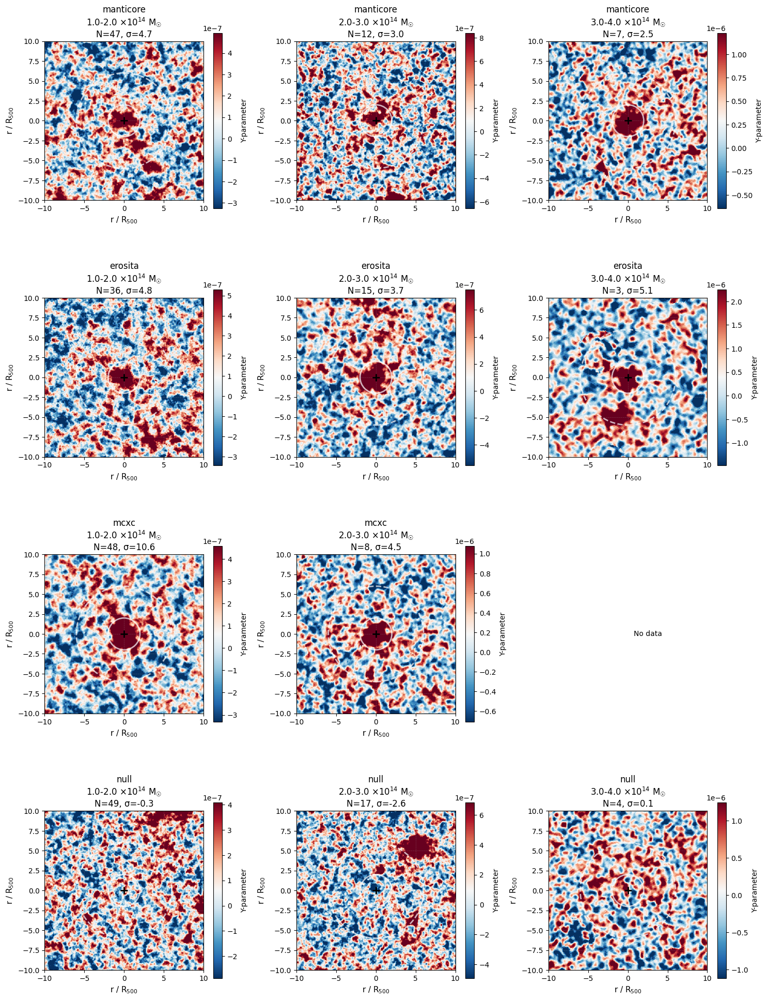


STACKED PATCH STATISTICS

MANTICORE:
  Mass bin 1.0-2.0 ×10^14 M☉:
    Clusters: 47
    Median R500: 0.259°
    Patch size: ±10.0 × R500
    Signal: 3.25e-07 ± 6.85e-08
    Significance: 4.75σ
    Patch mean: 6.83e-08
    Patch std: 2.52e-07
    Valid pixels: 262144/262144 (100.0%)
  Mass bin 2.0-3.0 ×10^14 M☉:
    Clusters: 12
    Median R500: 0.332°
    Patch size: ±10.0 × R500
    Signal: 4.53e-07 ± 1.50e-07
    Significance: 3.03σ
    Patch mean: 6.47e-08
    Patch std: 4.72e-07
    Valid pixels: 262144/262144 (100.0%)
  Mass bin 3.0-4.0 ×10^14 M☉:
    Clusters: 7
    Median R500: 0.317°
    Patch size: ±10.0 × R500
    Signal: 1.62e-06 ± 6.61e-07
    Significance: 2.46σ
    Patch mean: 2.67e-07
    Patch std: 6.65e-07
    Valid pixels: 262144/262144 (100.0%)

EROSITA:
  Mass bin 1.0-2.0 ×10^14 M☉:
    Clusters: 36
    Median R500: 0.226°
    Patch size: ±10.0 × R500
    Signal: 4.73e-07 ± 9.84e-08
    Significance: 4.80σ
    Patch mean: 7.62e-08
    Patch std: 2.89e-07
    Valid 

In [16]:
# ─── PLOT STACKED PATCHES ─────────────────────────────────────────────

# Determine grid layout based on number of datasets and mass bins
n_datasets = len(results_dict)
n_mass_bins = len(mass_bins)

fig, axes = plt.subplots(n_datasets, n_mass_bins, 
                         figsize=(5 * n_mass_bins, 5 * n_datasets))

# Ensure axes is 2D array even if we have single row/column
if n_datasets == 1:
    axes = axes.reshape(1, -1)
if n_mass_bins == 1:
    axes = axes.reshape(-1, 1)

# Dataset order for consistent plotting
dataset_order = ['manticore', 'erosita', 'mcxc', 'null']

for i, ds_name in enumerate(dataset_order):
    if ds_name not in results_dict:
        continue
        
    for j, (m1, m2) in enumerate(mass_bins):
        label = f"{m1:.1e}-{m2:.1e}"
        ax = axes[i, j]
        
        # Check if we have results for this combination
        if label not in results_dict[ds_name]:
            ax.axis('off')
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', 
                   transform=ax.transAxes)
            continue
        
        res = results_dict[ds_name][label]
        
        # Get stacked patch and info
        stacked_patch = res['stacked_patch']
        stacking_info = res['stacking_info']
        patch_size_r500 = res['patch_size_r500']
        
        # Calculate color limits (5th to 95th percentile)
        finite_data = stacked_patch[np.isfinite(stacked_patch)]
        if len(finite_data) > 0:
            vmin, vmax = np.percentile(finite_data, [5, 95])
        else:
            vmin, vmax = -1e-6, 1e-6
        
        # Plot stacked patch
        # Extent in r/r500 units
        extent = [-patch_size_r500/2, patch_size_r500/2, 
                  -patch_size_r500/2, patch_size_r500/2]
        
        im = ax.imshow(stacked_patch, extent=extent, origin='lower',
                      cmap='RdBu_r', vmin=vmin, vmax=vmax, 
                      interpolation='nearest')
        
        # Add center marker
        ax.plot(0, 0, 'k+', markersize=10, markeredgewidth=2)
        
        # Add aperture circles (in r/r500 units)
        inner_circle = plt.Circle((0, 0), inner_r500_factor, 
                                 fill=False, color='white', 
                                 linewidth=2, linestyle='-', alpha=0.7)
        outer_circle = plt.Circle((0, 0), outer_r500_factor, 
                                 fill=False, color='white', 
                                 linewidth=2, linestyle='--', alpha=0.7)
        ax.add_patch(inner_circle)
        ax.add_patch(outer_circle)
        
        # Labels and formatting
        ax.set_xlabel('r / R$_{500}$', fontsize=11)
        ax.set_ylabel('r / R$_{500}$', fontsize=11)
        
        # Get statistics from results
        n_clusters = res['n_measurements']
        if res['analysis_mode'] == 'tsz':
            significance = res['significance']
            title = f"{ds_name}\n{m1/1e14:.1f}-{m2/1e14:.1f} ×10$^{{14}}$ M$_☉$\n"
            title += f"N={n_clusters}, σ={significance:.1f}"
        else:
            title = f"{ds_name}\n{m1/1e14:.1f}-{m2/1e14:.1f} ×10$^{{14}}$ M$_☉$\n"
            title += f"N={n_clusters}"
        
        ax.set_title(title, fontsize=12)
        ax.set_aspect('equal')
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, shrink=0.8)
        cbar.set_label('Y-parameter', fontsize=10)
        
        # Add grid
        ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

# ─── PRINT SUMMARY STATISTICS ─────────────────────────────────────────
print("\n" + "="*70)
print("STACKED PATCH STATISTICS")
print("="*70)

for ds_name in dataset_order:
    if ds_name not in results_dict:
        continue
    
    print(f"\n{ds_name.upper()}:")
    for m1, m2 in mass_bins:
        label = f"{m1:.1e}-{m2:.1e}"
        
        if label not in results_dict[ds_name]:
            continue
        
        res = results_dict[ds_name][label]
        
        print(f"  Mass bin {m1/1e14:.1f}-{m2/1e14:.1f} ×10^14 M☉:")
        print(f"    Clusters: {res['n_measurements']}")
        print(f"    Median R500: {res['r500_median']:.3f}°")
        print(f"    Patch size: ±{res['patch_size_r500']/2:.1f} × R500")
        
        if res['analysis_mode'] == 'tsz':
            print(f"    Signal: {res['mean_delta_y']:.2e} ± {res['error_mean']:.2e}")
            print(f"    Significance: {res['significance']:.2f}σ")
        
        # Check stacked patch statistics
        stacked = res['stacked_patch']
        finite_vals = stacked[np.isfinite(stacked)]
        if len(finite_vals) > 0:
            print(f"    Patch mean: {np.mean(finite_vals):.2e}")
            print(f"    Patch std: {np.std(finite_vals):.2e}")
            print(f"    Valid pixels: {len(finite_vals)}/{stacked.size} ({100*len(finite_vals)/stacked.size:.1f}%)")

📊 Calculating radial profile in R/R500 coordinates...
   Radial bins: 20, Max radius: 5.0 × R500
   Profile calculated: 20/20 valid bins
   Radial range: 0 to 5.0 × R500


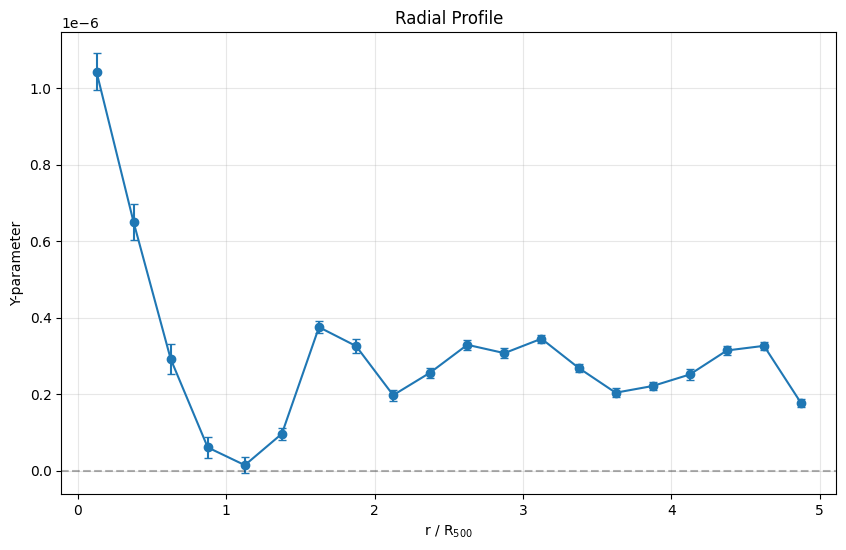

In [19]:
from stacking_backend import RadialProfileCalculator

# After running your analysis
#res = pipeline.run_individual_r500_analysis_with_validation(...)

# Calculate profile separately
#radii, profile, errors, counts = RadialProfileCalculator.calculate_profile(
#    stacked_patch=res['stacked_patch'],
#    patch_size_r500=res['patch_size_r500'],
#    n_radial_bins=20,
#    max_radius_r500=5.0  # Only go out to 5 R500
#)

# Or use the convenience function
radii, profile, errors, counts = RadialProfileCalculator.calculate_profile_from_results(
    results=res,
    n_radial_bins=20,
    max_radius_r500=5.0
)

# Plot it
plt.figure(figsize=(10, 6))
plt.errorbar(radii, profile, yerr=errors, fmt='o-', capsize=3)
plt.axhline(0, color='k', linestyle='--', alpha=0.3)
plt.xlabel('r / R$_{500}$')
plt.ylabel('Y-parameter')
plt.title('Radial Profile')
plt.grid(True, alpha=0.3)
plt.show()

In [20]:
res

{'success': True,
 'analysis_mode': 'tsz',
 'stacked_patch': array([[6.26854455e-07, 6.58140372e-07, 6.87580426e-07, ...,
         1.14092667e-06, 1.05769753e-06, 9.83042184e-07],
        [8.26835740e-07, 7.80706842e-07, 7.74300552e-07, ...,
         1.10241462e-06, 9.78030264e-07, 8.55768215e-07],
        [9.22162255e-07, 8.74788981e-07, 8.61049742e-07, ...,
         1.00022714e-06, 8.17263621e-07, 6.81600601e-07],
        ...,
        [5.31738031e-07, 4.09274989e-07, 3.45047257e-07, ...,
         9.39461476e-07, 9.59861735e-07, 9.24516146e-07],
        [4.79323574e-07, 3.64095750e-07, 2.87363572e-07, ...,
         8.98415768e-07, 9.22153346e-07, 9.12791127e-07],
        [4.14451925e-07, 3.07901319e-07, 2.00444997e-07, ...,
         9.02405760e-07, 9.79104585e-07, 9.84789741e-07]]),
 'stacking_info': {'n_patches': 4,
  'n_rejected': 0,
  'rejection_stats': {'insufficient_coverage': 0,
   'extraction_error': 0,
   'rescaling_failed': 0},
  'patch_size_r500': 20.0,
  'npix': 512,
  'val

In [ ]:
# Add this diagnostic cell
for ds_name in ['manticore', 'erosita']:
    label = "3.0e+14-4.0e+14"
    if label in results_dict[ds_name]:
        res = results_dict[ds_name][label]
        r500_values = res['r500_values']
        print(f"\n{ds_name.upper()}:")
        print(f"  N clusters: {len(r500_values)}")
        print(f"  R500 mean: {np.mean(r500_values):.4f}°")
        print(f"  R500 std: {np.std(r500_values):.4f}°")
        print(f"  R500 range: {np.min(r500_values):.4f}° - {np.max(r500_values):.4f}°")
        print(f"  Coefficient of variation: {np.std(r500_values)/np.mean(r500_values):.3f}")

In [ ]:
# Check mask coverage
for ds_name in ['manticore', 'erosita']:
    label = "3.0e+14-4.0e+14"
    if label in results_dict[ds_name]:
        res = results_dict[ds_name][label]
        coverages = [r['coverage'] for r in res['individual_results']]
        print(f"\n{ds_name.upper()} - Mask Coverage:")
        print(f"  Mean: {np.mean(coverages):.3f}")
        print(f"  Range: {np.min(coverages):.3f} - {np.max(coverages):.3f}")

In [ ]:
# Compare individual cluster S/N
for ds_name in ['manticore', 'erosita']:
    label = "3.0e+14-4.0e+14"
    if label in results_dict[ds_name]:
        res = results_dict[ds_name][label]
        if 'individual_measurements' in res:
            measurements = np.array(res['individual_measurements'])
            errors = np.array(res['individual_errors'])
            snrs = measurements / errors
            
            print(f"\n{ds_name.upper()} - Individual Cluster S/N:")
            print(f"  Mean S/N: {np.mean(snrs):.2f}")
            print(f"  S/N values: {snrs}")
            print(f"  Signal values: {measurements}")

In [ ]:
from scipy.ndimage import gaussian_filter
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable
import matplotlib.pyplot as plt
import numpy as np

# ─── CONFIGURATION ──────────────────────────────────────────────────────
# Smoothing FWHM - units depend on mode
smooth_fwhm = 0.3  # 0.3° for angular mode, 0.3 R500 for r500 mode

# Pick mass label for top row
m1, m2 = mass_bins[selected_mass_bin_index]
selected_label = f"{m1:.1e}-{m2:.1e}"

# Detect scaling mode from first available result
scaling_mode = None
for ds in ['manticore', 'erosita', 'mcxc', 'null']:
    res = results_dict[ds].get(selected_label, {})
    if res.get('scaling_mode'):
        scaling_mode = res['scaling_mode']
        break

if scaling_mode is None:
    # Fallback: check if profile_units exists
    for ds in ['manticore', 'erosita', 'mcxc', 'null']:
        res = results_dict[ds].get(selected_label, {})
        profile_units = res.get('profile_units', 'degrees')
        scaling_mode = 'r500' if profile_units == 'r/r500' else 'angular'
        if res:
            break

print(f"📊 Plotting in {scaling_mode.upper()} mode")

# ─── GLOBAL vmin/vmax FOR PATCHES ─────────────────────────────────────
vmin, vmax = -1, 1

# ─── MASS→COLOR MAPPING ────────────────────────────────────────────────
mass_centers = np.sqrt(np.array([x*y for x,y in mass_bins]))
discrete_colors = ['#e41a1c', '#377eb8', '#4daf4a', "pink"]
cmap_discrete = ListedColormap(discrete_colors)
mass_boundaries = [mass_bins[0][0]]
for m1, m2 in mass_bins:
    mass_boundaries.append(m2)
mass_boundaries = np.array(mass_boundaries)
norm_discrete = BoundaryNorm(mass_boundaries, ncolors=len(mass_bins))
colors = discrete_colors

# ─── FIGURE SETUP ──────────────────────────────────────────────────────
with plt.style.context(get_mplstyle_path(mnras_style)):
    fig, axes = plt.subplots(
        2, 4, figsize=(8.5, 4),
        gridspec_kw={'height_ratios': [1, 1], 'hspace': 0.4, 'wspace': 0.1}
    )
    dataset_names = ['manticore', 'erosita', 'mcxc', 'null']
    dataset_labels = [r'$\texttt{Manticore-Local}$', 'eROSITA', 'MCXC', 'Null']
    top_images = []
    
    # ── Top row: Stacked patches with text annotations ─────────────────────
    for col, (ds, ds_label) in enumerate(zip(dataset_names, dataset_labels)):
        ax = axes[0, col]
        res = results_dict[ds].get(selected_label, {})
        patch = res.get('stacked_patch')
        
        if patch is not None:
            # Get stacking info
            stacking_info = res.get('stacking_info', {})
            
            # Determine extent and pixel size based on mode
            if scaling_mode == 'r500':
                # Patch is in r/r500 units
                max_radius_r500 = stacking_info.get('max_radius_r500', 5.0)
                extent = [-max_radius_r500, max_radius_r500,
                         -max_radius_r500, max_radius_r500]
                npix = patch.shape[0]
                pixel_size = (2 * max_radius_r500) / npix
                
                # Convert smoothing from physical units to pixels
                sigma_pix = smooth_fwhm / (2.355 * pixel_size)
                
                # Axis limits
                axis_lim = max_radius_r500
                xlabel = r'$\Delta$RA [$r/r_{500}$]'
                ylabel = r'$\Delta$Dec [$r/r_{500}$]'
                
                # Apertures in r/r500 units
                inner_radius = inner_r500_factor  # Already in r/r500
                outer_radius = outer_r500_factor
                
            else:  # angular mode
                # Patch is in degrees
                patch_size_deg = res.get('patch_size_deg', 15.0)
                extent = [-patch_size_deg/2, patch_size_deg/2,
                         -patch_size_deg/2, patch_size_deg/2]
                npix = patch.shape[0]
                pixel_size = patch_size_deg / npix
                
                # Convert smoothing from degrees to pixels
                sigma_pix = smooth_fwhm / (2.355 * pixel_size)
                
                # Axis limits
                axis_lim = patch_size_deg / 2
                xlabel = r'$\Delta$RA [$\circ$]'
                ylabel = r'$\Delta$Dec [$\circ$]'
                
                # Apertures in degrees
                r500_median = res.get('r500_median', 0.5)
                inner_radius = r500_median * inner_r500_factor
                outer_radius = r500_median * outer_r500_factor
            
            # Apply smoothing
            patch_smooth = gaussian_filter(patch, sigma=sigma_pix)
            
            # Plot patch
            im = ax.imshow(patch_smooth / 1e-6, origin='lower', extent=extent,
                          cmap='RdBu_r', vmin=vmin, vmax=vmax)
            top_images.append(im)
    
            # Center marker & apertures
            circ_in = plt.Circle((0, 0), inner_radius,
                                fill=False, color='white', linewidth=2)
            circ_out = plt.Circle((0, 0), outer_radius,
                                 fill=False, color='white', linewidth=2, linestyle='--')
            ax.add_patch(circ_in)
            ax.add_patch(circ_out)
    
            # Annotate mass range & sigma
            sigma = res.get('significance', np.nan)
            txt = f"{m1/1e14:.0f}–{m2/1e14:.0f} " + r"$\times 10^{14}$ M$_{\odot}$" + "\n" + r"$\sigma=$" + f"{sigma:.1f}"
            ax.text(0.95, 0.05, txt,
                    transform=ax.transAxes,
                    ha='right', va='bottom',
                    fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
            # Set axis limits and labels
            ax.set_xlim(-axis_lim, axis_lim)
            ax.set_ylim(-axis_lim, axis_lim)
            
            if col == 0:
                ax.set_ylabel(ylabel)
            ax.set_xlabel(xlabel)
            ax.set_title(ds_label, pad=8)
            ax.grid(alpha=0.3)
            ax.set_aspect('equal')
        
            # Turn off y-tick labels on columns 2, 3, and 4 of the top row
            if col > 0:
                ax.tick_params(labelleft=False)
        
    # Shared vertical colorbar for top row
    if top_images:
        cbar_top = fig.colorbar(
            top_images[0], ax=axes[0, :],
            orientation='vertical', shrink=0.8, pad=0.02
        )
        cbar_top.set_label('$Y$ [arbitrary units]')
    
    # ── Bottom row: Radial profiles with dual error bars & mass colorbar ────
    for col, ds in enumerate(dataset_names):
        ax = axes[1, col]
        for idx, (m1, m2) in enumerate(mass_bins):
            label_key = f"{m1:.1e}-{m2:.1e}"
            res = results_dict[ds].get(label_key, {})
            r = res.get('profile_radii')
            y = res.get('profile_mean')
            e_pixel = res.get('profile_errors')  # pixel-level
            nsrc = res.get('n_measurements', 0)
            sigma = res.get('significance', np.nan)
    
            if r is None or y is None:
                continue
    
            mask = np.isfinite(r) & np.isfinite(y)
            if e_pixel is not None:
                mask &= np.isfinite(e_pixel)
            if not mask.any():
                continue
    
            # Single set of error bars: pixel-level radial errors
            ax.errorbar(
                r[mask], y[mask],
                yerr=e_pixel[mask] if e_pixel is not None else None,
                fmt='o-', color=colors[idx],
                capsize=1, markersize=2, linewidth=0.5,
                label=rf"$N={nsrc}$"
            )
    
        ax.axhline(0, color='black', linewidth=1, alpha=0.3)
        ax.grid(alpha=0.3)
        
        # Set x-axis limits and label based on mode
        if scaling_mode == 'r500':
            ax.set_xlim(-0.5, 5.5)  # Adjust to your max_radius_r500
            ax.set_xlabel(r"Radius [$r/r_{500}$]")
        else:
            # For angular mode, adjust based on your typical patch size
            ax.set_xlim(0, 7.5)  # Adjust to your max_radius_deg
            ax.set_xlabel(r"Radius [$\circ$]")
        
        ax.set_ylim(-0.1e-5, 1e-5)
        
        if col == 0:
            ax.set_ylabel('$Y$-parameter')
        else:
            ax.tick_params(labelleft=False)
        
        ax.legend(loc='upper right', fontsize=7, frameon=False)
    
    # Shared vertical colorbar for bottom row (mass → color)
    sm = ScalarMappable(cmap=cmap_discrete, norm=norm_discrete)
    sm.set_array([])
    cbar_bot = fig.colorbar(
        sm, ax=axes[1, :],
        orientation='vertical', shrink=0.8, pad=0.02,
        boundaries=mass_boundaries,
        ticks=mass_centers
    )
    cbar_bot.set_label(r'$M_{500}$ [$10^{14}$ M$_{\odot}$]')
    cbar_bot.set_ticklabels([f"{x/1e14:.0f}–{y/1e14:.0f}" for x, y in mass_bins])
    
    # ─── FINAL LAYOUT ───────────────────────────────────────────────────────
    plt.tight_layout(pad=0.1)
    
    # Include mode in filename
    output_file = f"./plots/stacked_patches_{scaling_mode}.pdf"
    plt.savefig(output_file)
    print(f"✅ Saved plot to {output_file}")
    plt.show()